### Imports and Device Setup

In [1]:
import os
import torch
import torchvision

DEVICE = torch.device("mps") if torch.backends.mps.is_available() else torch.device("cpu")
print(f"Using device:{DEVICE}")

NUM_WORKERS = os.cpu_count()
print(f"Number of CPU cores: {NUM_WORKERS}")

Using device:mps
Number of CPU cores: 8


### Global Parameters

In [2]:
BATCH_SIZE=32
IMG_SIZE=224; INPUT_CHANNELS=3
PATCH_SIZE=16
NUM_CLASSES=200

### Data Loading Pipeline

In [3]:
from torchvision.transforms import v2

TRAIN_TRANSFORMATIONS = v2.Compose([
    # Resize the image
    v2.Resize((IMG_SIZE, IMG_SIZE), interpolation=v2.InterpolationMode.BILINEAR, antialias=True),

    # Geometric Transformations
    v2.RandomHorizontalFlip(p=0.5), # Random horizontal flip
    v2.RandomRotation(degrees=15), # Random Rotation
    v2.RandomPerspective(distortion_scale=0.2, p=0.5), # Random Perspective

    # Photometric Transformations
    v2.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1), # Random Color Jitter

    # Convert to Tensors 
    v2.ToImage(), 
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
print(f"Training Transformations: {TRAIN_TRANSFORMATIONS}")

Training Transformations: Compose(
      Resize(size=[224, 224], interpolation=InterpolationMode.BILINEAR, antialias=True)
      RandomHorizontalFlip(p=0.5)
      RandomRotation(degrees=[-15.0, 15.0], interpolation=InterpolationMode.NEAREST, expand=False, fill=0)
      RandomPerspective(p=0.5, distortion_scale=0.2, interpolation=InterpolationMode.BILINEAR, fill=0)
      ColorJitter(brightness=(0.9, 1.1), contrast=(0.9, 1.1), saturation=(0.9, 1.1), hue=(-0.1, 0.1))
      ToImage()
      ToDtype(scale=True)
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], inplace=False)
)


In [4]:
TEST_TRANSFORMATIONS = v2.Compose([
    v2.Resize((IMG_SIZE, IMG_SIZE), interpolation=v2.InterpolationMode.BILINEAR, antialias=True),
    v2.ToImage(), 
    v2.ToDtype(torch.float32, scale=True),
    v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
print(f"Validation/Test Transformations: {TEST_TRANSFORMATIONS}")

Validation/Test Transformations: Compose(
      Resize(size=[224, 224], interpolation=InterpolationMode.BILINEAR, antialias=True)
      ToImage()
      ToDtype(scale=True)
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], inplace=False)
)


In [5]:
from helper_functions import create_train_val_dataloaders
ROOT_DIR = "./archive/CUB_200_2011/images"
train_dataloader, val_dataloader, class_names = create_train_val_dataloaders(root_dir=ROOT_DIR, train_transformations=TRAIN_TRANSFORMATIONS, 
                                                                             val_transformations=TEST_TRANSFORMATIONS, batch_size=BATCH_SIZE,
                                                                             num_workers=NUM_WORKERS, train_val_split=0.25)

Number of classes: 200
Class names: ['001.Black_footed_Albatross', '002.Laysan_Albatross', '003.Sooty_Albatross', '004.Groove_billed_Ani', '005.Crested_Auklet', '006.Least_Auklet', '007.Parakeet_Auklet', '008.Rhinoceros_Auklet', '009.Brewer_Blackbird', '010.Red_winged_Blackbird', '011.Rusty_Blackbird', '012.Yellow_headed_Blackbird', '013.Bobolink', '014.Indigo_Bunting', '015.Lazuli_Bunting', '016.Painted_Bunting', '017.Cardinal', '018.Spotted_Catbird', '019.Gray_Catbird', '020.Yellow_breasted_Chat', '021.Eastern_Towhee', '022.Chuck_will_Widow', '023.Brandt_Cormorant', '024.Red_faced_Cormorant', '025.Pelagic_Cormorant', '026.Bronzed_Cowbird', '027.Shiny_Cowbird', '028.Brown_Creeper', '029.American_Crow', '030.Fish_Crow', '031.Black_billed_Cuckoo', '032.Mangrove_Cuckoo', '033.Yellow_billed_Cuckoo', '034.Gray_crowned_Rosy_Finch', '035.Purple_Finch', '036.Northern_Flicker', '037.Acadian_Flycatcher', '038.Great_Crested_Flycatcher', '039.Least_Flycatcher', '040.Olive_sided_Flycatcher', '041.

### Visualising the datasets

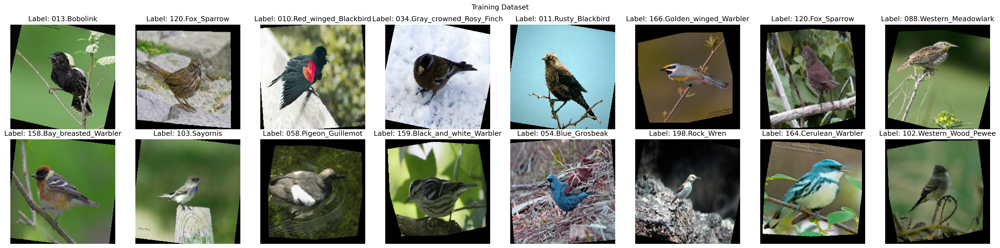

In [6]:
from helper_functions import visualize_dataset

visualize_dataset(dataset=train_dataloader, class_names=class_names, num_images=16, name="Training Dataset", cols=8)

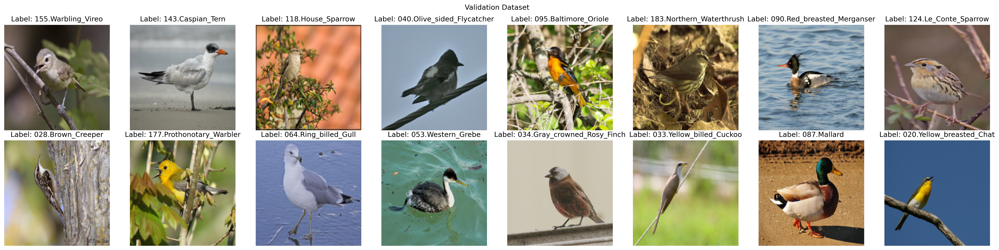

In [7]:
visualize_dataset(dataset=val_dataloader, class_names=class_names, num_images=16, name="Validation Dataset", cols=8)

### Vision Transformer Architecture

In [8]:
# Pretrained ViT base model
pretrained_vit_weights = torchvision.models.ViT_B_16_Weights.DEFAULT
pretrained_vit_model = torchvision.models.vit_b_16(weights=pretrained_vit_weights).to(DEVICE)

# Freezing the base parameters
for paramater in pretrained_vit_model.parameters():
    paramater.requires_grad = False

pretrained_vit_model.heads = torch.nn.Linear(in_features=int((PATCH_SIZE**2)*INPUT_CHANNELS), out_features=NUM_CLASSES).to(DEVICE)

In [9]:
from torchinfo import summary
image_batch, label_batch = next(iter(train_dataloader))
summary(model=pretrained_vit_model, input_size=tuple(image_batch.shape),
        col_names=["input_size", "output_size", "num_params", "trainable"], row_settings=["var_names"])

Layer (type (var_name))                                      Input Shape               Output Shape              Param #                   Trainable
VisionTransformer (VisionTransformer)                        [32, 3, 224, 224]         [32, 200]                 768                       Partial
├─Conv2d (conv_proj)                                         [32, 3, 224, 224]         [32, 768, 14, 14]         (590,592)                 False
├─Encoder (encoder)                                          [32, 197, 768]            [32, 197, 768]            151,296                   False
│    └─Dropout (dropout)                                     [32, 197, 768]            [32, 197, 768]            --                        --
│    └─Sequential (layers)                                   [32, 197, 768]            [32, 197, 768]            --                        False
│    │    └─EncoderBlock (encoder_layer_0)                   [32, 197, 768]            [32, 197, 768]            (7,087,872)   

### Optimizer and Loss Function

In [10]:
optimizer = torch.optim.Adam(lr=1e-3, params=pretrained_vit_model.parameters())
loss_fn = torch.nn.CrossEntropyLoss()

### Training the model & saving the model and history

In [11]:
from helper_functions import set_seeds
set_seeds()

from engine import train
pretrained_history = train(model=pretrained_vit_model, train_dataloader=train_dataloader, val_dataloader=val_dataloader, 
                loss_fn=loss_fn, optimizer=optimizer, epoch=5, device=DEVICE)


from helper_functions import save_model, save_history
SAVE_DIR = "./training_checkpoints"
save_model(model=pretrained_vit_model, save_dir=SAVE_DIR, name="model_transfer_learning")
save_history(history=pretrained_history, save_dir=SAVE_DIR, name="pretrained_training_history")

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/277 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

|| Epoch 1 Summary ||
train_loss: 3.161573 | train_accuracy: 0.323082 | val_loss: 1.902019 | val_accuracy: 0.570766


  0%|          | 0/277 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

|| Epoch 2 Summary ||
train_loss: 1.711752 | train_accuracy: 0.600060 | val_loss: 1.468749 | val_accuracy: 0.619960


  0%|          | 0/277 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

|| Epoch 3 Summary ||
train_loss: 1.299554 | train_accuracy: 0.695578 | val_loss: 1.291642 | val_accuracy: 0.667876


  0%|          | 0/277 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

|| Epoch 4 Summary ||
train_loss: 1.059835 | train_accuracy: 0.751632 | val_loss: 1.171087 | val_accuracy: 0.694220


  0%|          | 0/277 [00:00<?, ?it/s]

  0%|          | 0/93 [00:00<?, ?it/s]

|| Epoch 5 Summary ||
train_loss: 0.897352 | train_accuracy: 0.785958 | val_loss: 1.130429 | val_accuracy: 0.706317
Save model to path:./training_checkpoints/model_transfer_learning_weights.pth


### Plotting the training curves

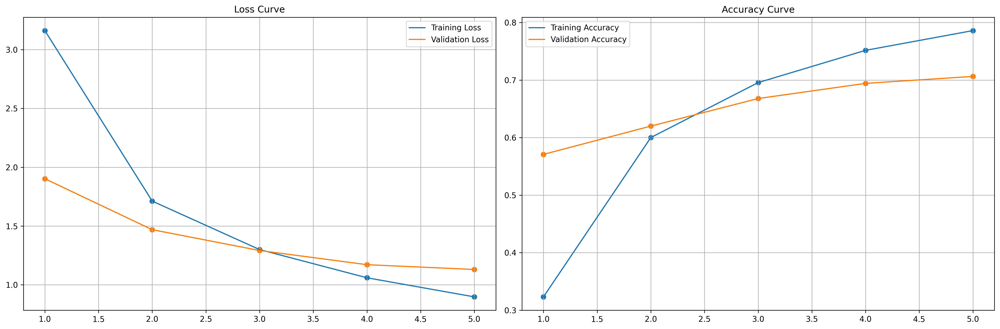

In [12]:
from helper_functions import plot_loss_acc_curves
plot_loss_acc_curves(results=pretrained_history, scatter=True)

### Predict of Validation dataset

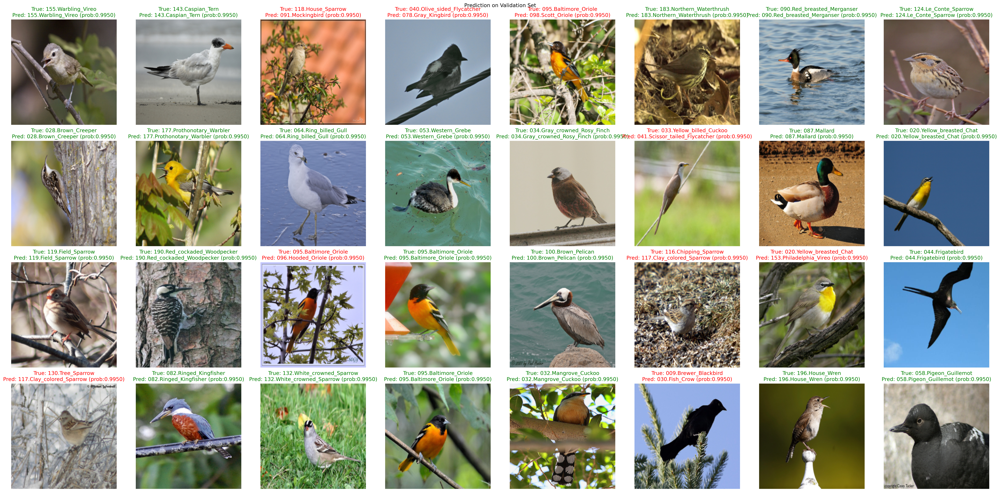

In [13]:
from helper_functions import pred_plot_dataset
pred_plot_dataset(dataset=val_dataloader, model=pretrained_vit_model, class_names=class_names, device=DEVICE, name="Prediction on Validation Set")